# OPTIONAL Workbook for Final Project, Part 3

Your group is welcome to work on a local version of a notebook for this assignment.

This workspace is here if you'd rather not have to install all necessary packages locally.

You can download any json files to your local computer to add them to your local jekyll page.

To download, you can right-click on the file and hit download.  For example, with the following code:

```python
from vega_datasets import data
import altair as alt

source = data.cars()
source.rename(columns={"Miles_per_Gallon":"Miles per Gallon"}, 
              inplace=True)


chart = alt.Chart(source).mark_circle(size=60).encode(
    x='Horsepower',
    y='Miles per Gallon',
    color='Origin',
    tooltip=['Name', 'Origin', 'Horsepower', 'Miles per Gallon']
).interactive()

chart.properties(width='container').save("cars.json")
```

You can download from the side bar like this:

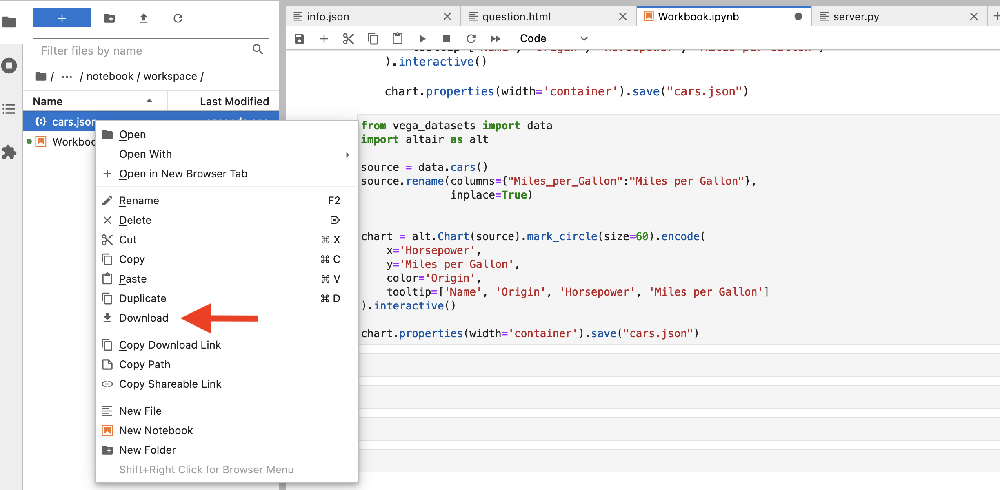

In [44]:
import json
import pandas as pd
import re

with open("avatar_map.json", "r", encoding="utf-8") as f:
    data = json.load(f)

# extract only the title text from markers
place_names = [
    m["popup"]["title"]
    for m in data["markers"]
    if "popup" in m and "title" in m["popup"]
]

name_map = {p.lower(): p for p in place_names}

# print(place_names)

In [45]:
# raw transcript data: avatar.csv
data_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-08-11/avatar.csv'
df = pd.read_csv(data_url)

sorted_places = sorted(place_names, key=len, reverse=True)
pattern = re.compile(
    r"\b(" + "|".join(re.escape(p) for p in sorted_places) + r")\b",
    flags=re.IGNORECASE
)

def extract_places(text):
    if not isinstance(text, str):
        return []
    matches = pattern.findall(text)
    out = []
    seen = set()
    for m in matches:
        key = m.lower()
        canonical = name_map.get(key, m)
        if canonical not in seen:
            seen.add(canonical)
            out.append(canonical)
    return out

df["places_in_line"] = df["full_text"].apply(extract_places)

In [46]:
long_places = (
    df.explode("places_in_line")
      .dropna(subset=["places_in_line"])
)

# one row per place per chapter, with book + episode metadata
place_chapter_table = (
    long_places
    .groupby(
        ["book", "book_num", "chapter", "chapter_num", "places_in_line"],
        as_index=False
    )
    .size()
    .rename(columns={"size": "mention_count"})
)

# print("Per-line detection (sample):")
# print(df[["id", "chapter", "character", "places_in_line"]].head(), "\n")

# print("Place ↔ chapter mapping (for timelines):")
# print(place_chapter_table.head())



In [47]:
place_chapter_table = (
    place_chapter_table
    .sort_values(
        by=["book_num", "chapter_num", "places_in_line"],
        ascending=[True, True, True]
    )
    .reset_index(drop=True)
)

In [48]:
# place_chapter_table

In [49]:
import pandas as pd
import numpy as np
import bqplot as bq
import ipywidgets as widgets
from IPython.display import display

# ordered episode index
episodes = (
    place_chapter_table[["book_num", "chapter_num", "chapter"]]
    .drop_duplicates()
    .sort_values(["book_num", "chapter_num"])
    .reset_index(drop=True)
)

episodes["episode_idx"] = range(1, len(episodes) + 1)

timeline_df_full = place_chapter_table.merge(
    episodes[["book_num", "chapter_num", "episode_idx"]],
    on=["book_num", "chapter_num"],
    how="left"
)

timeline_df_full = (
    timeline_df_full
    .sort_values(["book_num", "chapter_num", "places_in_line"])
    .reset_index(drop=True)
)

# episode bounds and window size
ep_min = int(timeline_df_full["episode_idx"].min())
ep_max = int(timeline_df_full["episode_idx"].max())
WINDOW_SIZE = 10

def window_bounds_from_start(start):
    end = min(start + WINDOW_SIZE - 1, ep_max)
    return start, end

def get_window_matrix(start):
    start, end = window_bounds_from_start(start)
    wdf = timeline_df_full[
        (timeline_df_full["episode_idx"] >= start) &
        (timeline_df_full["episode_idx"] <= end)
    ]
    if wdf.empty:
        return np.zeros((0, 0)), [], list(range(start, end + 1)), start, end
    pivot = wdf.pivot_table(
        index="places_in_line",
        columns="episode_idx",
        values="mention_count",
        aggfunc="sum",
        fill_value=0
    )
    col_labels = list(range(start, end + 1))
    pivot = pivot.reindex(columns=col_labels, fill_value=0)
    row_labels = list(pivot.index)
    color_data = pivot.values
    return color_data, row_labels, col_labels, start, end

start_init = ep_min
color_data, row_labels, col_labels, start_init, end_init = get_window_matrix(start_init)

# bqplot scales and axes 
x_sc = bq.LinearScale(min=start_init, max=end_init)
y_sc = bq.OrdinalScale()
c_sc = bq.ColorScale(colors=['#F9EFE3', '#F4C135', '#EE7223', '#6E1700'])

x_ax = bq.Axis(scale=x_sc, label="Episode Index", tick_format="0", grid_lines="solid")
y_ax = bq.Axis(scale=y_sc, orientation="vertical")
c_ax = bq.ColorAxis(scale=c_sc, label="Mentions", orientation="vertical", side="right")

# heatmap
heat = bq.GridHeatMap(
    color=color_data,
    row=row_labels,
    column=col_labels,
    scales={"row": y_sc, "column": x_sc, "color": c_sc},
    interactions={"click": "select"},
    anchor_style={"fill": "white", "stroke": "black"},
)

x_ax.tick_values = list(range(start_init, end_init + 1))

fig = bq.Figure(
    marks=[heat],
    axes=[x_ax, y_ax, c_ax],
    title="Avatar Locations Timeline Based on Transcript Data",
    layout={"height": "600px", "width": "1000px"},
    padding_x= 0.1,
    fig_margin= {'top': 60, 'bottom': 60, 'left': 150, 'right': 50}
)

# fixed episode windows

last_start = max(ep_min, ep_max - WINDOW_SIZE + 1)
starts = list(range(ep_min, last_start + 1, WINDOW_SIZE))

episode_window = widgets.SelectionSlider(
    options=[(f"Episodes {s}-{window_bounds_from_start(s)[1]}", s) for s in starts],
    value=start_init,
    description="Window",
    continuous_update=True,
    orientation="horizontal",
)

def on_window_change(change):
    start = change["new"]
    color_data, row_labels, col_labels, w_start, w_end = get_window_matrix(start)
    x_sc.min = w_start
    x_sc.max = w_end
    x_ax.tick_values = list(range(w_start, w_end + 1))
    if color_data.size == 0:
        heat.color = np.zeros((0, 0))
        heat.row = []
        heat.column = list(range(w_start, w_end + 1))
    else:
        heat.color = color_data
        heat.row = row_labels
        heat.column = col_labels

episode_window.observe(on_window_change, names="value")

display(widgets.VBox([fig, episode_window], layout=widgets.Layout(padding='20px')))

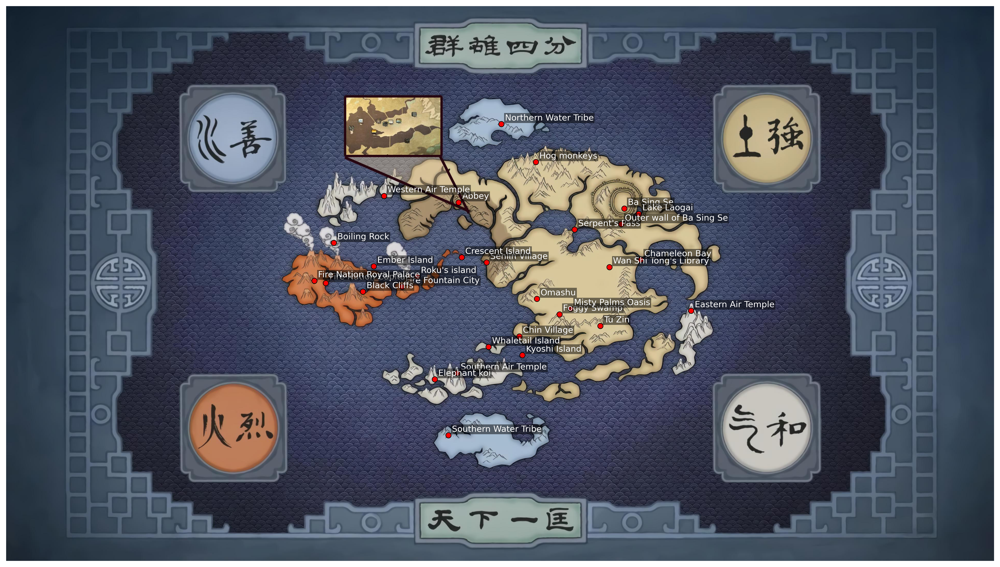

In [55]:
import json
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# total mentions per place
mention_totals = (
    place_chapter_table
    .groupby("places_in_line")["mention_count"]
    .sum()
    .sort_values(ascending=False)
)

top30_places = list(mention_totals.head(30).index)

# avatar_map.json data
with open("avatar_map.json") as f:
    cfg = json.load(f)

img = np.asarray(Image.open(cfg["mapImage"]))
height, width = img.shape[:2]

selected_markers = []

for m in cfg["markers"]:
    name = m["popup"]["title"]
    if name in top30_places:
        selected_markers.append(m)

# positions + names
x_vals = [m["position"][0] for m in selected_markers]
y_vals = [m["position"][1] for m in selected_markers]
titles = [m["popup"]["title"] for m in selected_markers]

# matplotlib static map
fig = plt.figure(figsize=(22, 12), dpi=350)   # ULTRA HD
plt.imshow(img, extent=[0, width, 0, height])

plt.scatter(
    x_vals, y_vals,
    s=40,
    c="red",
    edgecolors="black",
    linewidth=0.7,
    zorder=3
)

# label each point
for x, y, title in zip(x_vals, y_vals, titles):
    plt.text(
        x + 14,
        y + 14,
        title,
        fontsize=10,
        color="white",
        zorder=4,
        bbox=dict(facecolor="black", alpha=0.5, linewidth=0, pad=1)
    )

plt.axis("off")

plt.show()
# plt.savefig("avatar_top30_mentions_map.png", dpi=600)

In [54]:
import pandas as pd
from collections import defaultdict
import bqplot as bq
from ipywidgets import Layout
import ipywidgets as widgets

# avatar.csv dataset
data_url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-08-11/avatar.csv"
df = pd.read_csv(data_url)

# making sure character aliases are counted for
alias_map = {
    "The Blue Spirit": "Zuko",
    "King Bumi": "Bumi"
    # add more...
}

def allchars(char):
    return alias_map.get(char, char)

df["character"] = df["character"].map(allchars)

# predetermining bending abilities per character
bending_map = {
    "Aang": {"Air", "Water", "Earth", "Fire", "Energy"},
    "Katara": {"Water", "Blood"},
    "Zuko": {"Fire"},
    "Toph": {"Earth", "Metal", "Sand"},
    "Sokka": {"None"},
    "Iroh": {"Fire", "Lightning"},
    "Azula": {"Fire", "Lightning"},
    "Mai": {"None"},
    "Ty Lee": {"None"},
    "Suki": {"None"},
    "Hama": {"Water", "Blood"},
    "Bumi": {"Earth"},
}

# helper
def get_bendings(char):
    bends = bending_map.get(char, set())
    if isinstance(bends, str):
        bends = {bends}
    return set(bends)

# choosing characters' primary bending element for node colors
def primary_bending(char):
    bends = get_bendings(char)
    if not bends:
        return "Unknown"
    priority_order = ["Air", "Water", "Earth", "Fire", "None"]
    for b in priority_order:
        if b in bends:
            return b
    return sorted(bends)[0]

color_map = {
    "Air": "#F4C135",
    "Water": "#B6D7F4",
    "Earth": "#715447",
    "Fire": "#EE7223",
    "None": "#9e9e9e",
    "Unknown": "#9e9e9e",
}

# calculating character–character interaction
# interaction = co-appearance in same episode
# edge between nodes kept only if they share at least one bending ability
pair_book_counts = defaultdict(lambda: defaultdict(int))

for (book, chap), g in df.groupby(["book", "chapter_num"]):
    chars = sorted(g["character"].dropna().unique())
    for i in range(len(chars)):
        for j in range(i + 1, len(chars)):
            c1, c2 = chars[i], chars[j]
            b1 = get_bendings(c1)
            b2 = get_bendings(c2)
            if not b1.intersection(b2):
                continue
            pair_book_counts[(c1, c2)][book] += 1

char_partner_counts = defaultdict(lambda: defaultdict(int))

for (c1, c2), book_counts in pair_book_counts.items():
    total = sum(book_counts.values())
    char_partner_counts[c1][c2] += total
    char_partner_counts[c2][c1] += total

def top_partner(char):
    partners = char_partner_counts.get(char, {})
    if not partners:
        return "None"
    return max(partners.items(), key=lambda kv: kv[1])[0]

# node_data and link_data for bqplot.Graph
characters = sorted({c for pair in pair_book_counts.keys() for c in pair})
char_index = {c: i for i, c in enumerate(characters)}

node_data = []
node_colors = []  # collecting node colors for each character

for char in characters:
    primary = primary_bending(char)
    node_data.append(
        dict(
            label=char,
            bending_primary=primary,
            bendings=primary,  # using primary only (no bends variable)
            top_interaction_partner=top_partner(char),
        )
    )
    node_colors.append(color_map.get(primary, "#9e9e9e"))

link_data = []
for (c1, c2), book_counts in pair_book_counts.items():
    total = sum(book_counts.values())
    top_book, top_count = max(book_counts.items(), key=lambda kv: kv[1])
    i = char_index[c1]
    j = char_index[c2]
    link_data.append(
        dict(
            source=i,
            target=j,
            source_label=c1,
            target_label=c2,
            top_book=top_book,
            top_count=top_count,
            total_interactions=total,
        )
    )

# tooltip
tooltip = bq.Tooltip(
    fields=[
        "label",                  # node hover
        "bending_primary",        # node hover
        "bendings",               # node hover
        "top_interaction_partner",# node hover: character with most interactions
    ],
    labels=[
        "Character",
        "Primary Bending",
        "All Bendings",
        "Character with most interactions",
    ],
    show_labels=True,
)

# figure
graph = bq.Graph(
    node_data=node_data,
    link_data=link_data,
    directed=False,
    enable_hover=True,
    charge=-600,
    link_distance=440,
    static=True,
    enable_move=False,
    allow_drag=False,
    tooltip=tooltip,
    highlight_links=True,
)

graph.colors = node_colors

fig_layout = Layout(width="900px", height="900px")
fig = bq.Figure(marks=[graph], layout=fig_layout)

# helper determining if someone is a bender (primary bending not "None")
def is_bender(char):
    return primary_bending(char) != "None"

# building filtered graph data for show-only-benders toggle
def build_graph_data(show_only_benders=False):
    if not show_only_benders:
        return node_data, node_colors, link_data

    # characters whose primary bending is not None
    bender_chars = sorted([c for c in characters if is_bender(c)])
    char_index_filtered = {c: i for i, c in enumerate(bender_chars)}

    # filtered nodes
    nd = []
    cols = []
    for char in bender_chars:
        primary = primary_bending(char)
        nd.append(
            dict(
                label=char,
                bending_primary=primary,
                bendings=primary,
                top_interaction_partner=top_partner(char),
            )
        )
        cols.append(color_map.get(primary, "#9e9e9e"))

    # filtered links (only between benders)
    ld = []
    for (c1, c2), book_counts in pair_book_counts.items():
        if c1 not in char_index_filtered or c2 not in char_index_filtered:
            continue
        total = sum(book_counts.values())
        top_book, top_count = max(book_counts.items(), key=lambda kv: kv[1])
        i = char_index_filtered[c1]
        j = char_index_filtered[c2]
        ld.append(
            dict(
                source=i,
                target=j,
                source_label=c1,
                target_label=c2,
                top_book=top_book,
                top_count=top_count,
                total_interactions=total,
            )
        )

    return nd, cols, ld

# toggle button for hiding non-benders
toggle_benders = widgets.ToggleButton(
    value=False,
    description="show only benders",
    icon="fire",
)

# updating graph data when toggle changes
def on_toggle_benders(change):
    show_only = change["new"]
    nd, cols, ld = build_graph_data(show_only_benders=show_only)
    graph.node_data = nd
    graph.link_data = ld
    graph.colors = cols

toggle_benders.observe(on_toggle_benders, names="value")

# combining toggle and figure into a dashboard layout
dashboard = widgets.HBox([fig])
dashboard


Our primary visualization is a heatmap showing how often major locations are mentioned throughout the episodes of Avatar: The Last Airbender. Each row represents a different place in the Avatar world, such as the Southern Water Tribe, Omashu, or Ba Sing Se, and each column represents an episode. The color of each cell reflects how frequently that location is mentioned in that specific episode. Darker colors indicate heavier narrative focus, while lighter colors show places that are not discussed as much. By scanning the heatmap, viewers can quickly understand how the story moves across the world as the series progresses. The heatmap also helps us understand the pacing of the narrative. A concentration of activity around locations like the Southern Air Temple or Omashu show when the characters encounter major turning points in their journey. Meanwhile, robust locations like the city of Ba Sing Se have a somewhat dense concentration over numerous episodes. 

It is also helpful to understand the physical landscape of the Avatar world. Our first contextual visualization is a map displaying the thirty locations with the highest mention counts in the transcripts. Using official fan-maintained coordinates, we marked each major site—such as Ba Sing Se and the Southern Water Tribe, with red dots and clear labels.

This map connects the heatmap’s patterns to actual geography. When a location shows strong activity in the heatmap, the viewer can refer to this map to understand precisely where that place sits within the world. This visualization helps newcomers visualize the distance between story events and recognize regional clusters. For example, many early-series settings are centered in the southern polar region, while mid-series ones occur across the Earth Kingdom. The map makes these shifts tangible and visually engaging.

The second contextual visualization is a character interaction network showing how often different characters appear together or engage with one another. Each circle represents a character, and the lines show connections formed when characters share episodes. This network helps readers understand the social dimension of the story. Characters at the center of the network, like Aang and Zuko, participate in many scenes across many locations, while characters with minor roles sit closer to the edges. When presented alongside the heatmap and map, this visualization clarifies how character journeys and relationships shape the shifting geographical focus of the show.



I obtained the __Avatar CSV__ file I am analyzing from the R for Data Science's (R4DS) August 11, 2020 Tidy Tuesday Github folder. The exact URL to the data is stored in the variable [data_url](https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-08-11/avatar.csv). Every week, a new dataset is explored by Tidy Tuesday participants, and I decided to utilize one derived from the show _Avatar: The Last Airbender's_ transcripts. The data was first compiled in the [appa](https://github.com/averyrobbins1/appa) R package created by Avery Robbins. The original data came from the [Avatar Wiki](https://avatar.fandom.com/wiki/Avatar_Wiki), and the example code used to scrape this dataset is also covered on Avery's blog along with a quick exploration of the available data.

I obtained the __Avatar Map JSON__ from the [Avatar Wiki](https://avatar.fandom.com/wiki/Avatar_Wiki), and this data is also available under CC-BY-SA. ([Map source code](https://avatar.fandom.com/wiki/Map:Avatar_world_map?action=edit))

** I created all v